<a href="https://colab.research.google.com/github/DeadLetterQueue/prettymaps/blob/main/ReadGPXFile.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install overpy
!pip install git+https://github.com/abey79/vsketch#egg=vsketch
!pip install git+https://github.com/DeadLetterQueue/prettymaps.git
!pip install vsketch
!pip install geopandas
!pip install cartopy
!pip install git+https://github.com/dodo-saba/fit2gpx.git
#!apt-get -qq install -y libarchive-dev
#!pip install  tcx2gpx
#!pip install pydot
##!pip install -U libarchive
#!apt-get -qq install -y libarchive-dev
#!pip install  tcx2gpx
#!pip install pydot
#!pip install -U libarchive
#!apt-get -qq install -y graphviz && pip install pydot
!pip install cartopy
!mkdir ../prints
!mkdir ../assets
!mkdir ../assets/Permanent_Marker/
!wget -O ../assets/Permanent_Marker/PermanentMarker-Regular.ttf https://github.com/marceloprates/prettymaps/raw/main/assets/Permanent_Marker/PermanentMarker-Regular.ttf

  Cloning https://github.com/abey79/vsketch to /tmp/pip-install-yop2i7iq/vsketch_bee8cb7e53434e22915f32b75971a9d2
  Running command git clone -q https://github.com/abey79/vsketch /tmp/pip-install-yop2i7iq/vsketch_bee8cb7e53434e22915f32b75971a9d2
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Cloning https://github.com/abey79/vpype (to revision e8aab428b6790de03e36cd51aa30ca0612a38d87) to /tmp/pip-install-yop2i7iq/vpype_3e213d4eb8fb4e009e0c47bc3c26c6ad
  Running command git clone -q https://github.com/abey79/vpype /tmp/pip-install-yop2i7iq/vpype_3e213d4eb8fb4e009e0c47bc3c26c6ad
  Running command git rev-parse -q --verify 'sha^e8aab428b6790de03e36cd51aa30ca0612a38d87'
  Running command git fetch -q https://github.com/abey79/vpype e8aab428b6790de03e36cd51aa30ca0612a38d87
  Running command git checkout -q e8aab428b6790de03e36cd51aa30ca0612a38d87
  Installing build dependencies ... done
  Getting requirements t

  Cloning https://github.com/DeadLetterQueue/prettymaps.git to /tmp/pip-req-build-4s5ixd_t
  Running command git clone -q https://github.com/DeadLetterQueue/prettymaps.git /tmp/pip-req-build-4s5ixd_t
  Using cached vpype-1.9.0a0-py3-none-any.whl
  Using cached Cartopy-0.20.2.tar.gz (10.8 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 7.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 26.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 12.1 MB 23.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 44 kB 2.9 MB/s 
  Created wheel for cartopy: filename=Cartopy-0.19.0.post1-cp37-cp37m-linux_x86_64

In [ ]:
!pip uninstall -y prettymaps
!pip install --no-dependencies git+https://github.com/DeadLetterQueue/prettymaps.git


In [1]:
!curl  'https://raw.githubusercontent.com/Toblerity/Shapely/master/docs/code/figures.py' -o '/usr/local/lib/python3.7/dist-packages/shapely/figures.py'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1685  100  1685    0     0   5168      0 --:--:-- --:--:-- --:--:--  5168


In [2]:
# For local execution (does not require installing the library):
%load_ext autoreload
%autoreload 2
#import pydot
import cartopy

import sys; sys.path.append('../')
import cartopy.crs as ccrs
from prettymaps import *
import vsketch
import osmnx as ox
import matplotlib.font_manager as fm
from matplotlib import pyplot as plt
from descartes import PolygonPatch
from shapely.geometry import *
from shapely.affinity import *
from shapely.ops import unary_union
import warnings
from matplotlib.patches import Ellipse, Polygon
import matplotlib.hatch
import matplotlib.pyplot as plt
from shapely.ops import polylabel
import matplotlib.patheffects as path_effects

import overpy
import numpy as np
import geopandas as gpd
import shapely.geometry as geometry
from geopandas import GeoDataFrame, read_file
from shapely.ops import linemerge, unary_union, polygonize
import fiona
import logging
from datetime import datetime
from pathlib import Path
import dateutil.parser

#from gpxpy import gpx
#from tcxparser import TCXParser


In [10]:
fname ='/content/drive/MyDrive/strava_export/activities/1122384023.fit'
gpx_file_in = '/content/drive/MyDrive/strava_export/activities/212179983.gpx'
#/content/drive/MyDrive/strava_export/activities/1122384023.gpx
'''gpx_file_out = fname[:len(fname) - 4] + '.gpx'
from fit2gpx import Converter
conv = Converter()
gpx = conv.fit_to_gpx(f_in=fname, f_out=gpx_file_out)
gpx_file_in = gpx_file_out
print(gpx_file_in)'''

# Open tracks layer
tracks_layer = fiona.open(gpx_file_in, layer='tracks')
(feature) = tracks_layer[0]
print()
# Print out the number of features in the tracks layer
print("# of features:\n--------------\n", len(list(tracks_layer.items())))

# Print out fields and attribute data
properties = feature['properties']
print("Feature attribute data:\n-----------------------")
for k, v in properties.items():
    print('{}: {}'.format(k,v))
print('')
tracks_layer = gpd.read_file(gpx_file_out, layer='tracks')
tracks_layer.set_crs(crs="EPSG:4326")
print('dd')
print(tracks_layer['geometry'].geom_type == 'GeometryCollection')
print(tracks_layer['geometry'].length)
print('dd')
if isinstance(tracks_layer['geometry'],GeometryCollection):
  print('A')
print(tracks_layer['geometry'].type)
tracks_layer = ox.project_gdf(tracks_layer)
tracks_shape = shape(tracks_layer['geometry'])

# Draw a quick plot of data using shapely
from shapely.geometry import shape
tracks_data = {'type': 'MultiLineString',
               'coordinates': feature['geometry']['coordinates']}
tracks_shape = shape(tracks_data)
tracks_shape


# of features:
--------------
 1
Feature attribute data:
-----------------------
name: None
cmt: None
desc: None
src: None
link1_href: None
link1_text: None
link1_type: None
link2_href: None
link2_text: None
link2_type: None
number: None
type: None

dd
0    False
dtype: bool
0    0.2855
dtype: float64
dd
0    MultiLineString
dtype: object


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

/usr/local/lib/python3.7/dist-packages/shapely/geometry/geo.py:123: ShapelyDeprecationWarning: GeometryTypeError will derive from ShapelyError and not TypeError or ValueError in Shapely 2.0.
  raise GeometryTypeError("Unknown geometry type: %s" % geom_type)


GeometryTypeError: ignored

In [ ]:
fig, ax = plt.subplots(figsize = (12, 12), constrained_layout = True)

def postprocessing(layers):
  print(layers['water']);
  return layers

layers = plot(
    #(29.54559,-98.62181), radius = 2200,
    (29.5894, -98.60154), radius = 2200,
    ax = ax,
    postprocessing = postprocessing,
    heat_map = True,
    layers = {
            'perimeter': {},
            'streets': {
                'custom_filter': '["highway"~"motorway|trunk|primary|secondary|tertiary|residential|service|unclassified|pedestrian|footway"]',
                'width': {
                    'motorway': 5,
                    'trunk': 5,
                    'primary': 4.5,
                    'secondary': 4,
                    'tertiary': 3.5,
                    'residential': 3,
                    'service': 2,
                    'unclassified': 2,
                    'pedestrian': 2,
                    'footway': 1,
                }
            },
            'building': {'tags': {'building': True, 'landuse': 'construction'}, 'union': False},
            'water': {'tags': {'natural': ['water', 'bay']}},
            'green': {'tags': {'landuse': 'grass', 'natural': ['island', 'wood'], 'leisure': 'park'}},
            'forest': {'tags': {'landuse': 'forest'}},
            'gpx': {'tags':{'gpx_file':'/content/drive/MyDrive/strava_export/activities/*.fit','heat_map': True, 'limit':20}},
            'parking': {'tags': {'amenity': 'parking', 'highway': 'pedestrian', 'man_made': 'pier'}}
        },
        drawing_kwargs = {
            'background': {'fc': '#F2F4CB', 'ec': '#dadbc1', 'hatch': 'ooo...', 'zorder': -1},
            'perimeter': {'fc': '#F2F4CB', 'ec': '#dadbc1', 'lw': 0, 'hatch': 'ooo...',  'zorder': 0},
            'green': {'fc': '#D0F1BF', 'ec': '#2F3737', 'lw': 1, 'zorder': 1},
            'forest': {'fc': '#64B96A', 'ec': '#2F3737', 'lw': 1, 'zorder': 1},
            'water': {'fc': '#a1e3ff', 'ec': '#2F3737', 'hatch': 'ooo...', 'hatch_c': '#85c9e6', 'lw': 1, 'zorder': 2},
            'parking': {'fc': '#F2F4CB', 'ec': '#2F3737', 'lw': 1, 'zorder': 1},
            'streets': {'fc': '#2F3737', 'ec': '#475657', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'gpx': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 3, 'zorder': 3},
            'coastline': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 0, 'zorder': 7},
            'building': {'palette': ['#FFC857', '#E9724C', '#C5283D'], 'ec': '#2F3737', 'lw': .5, 'zorder': 2},
            'streets': {'fc': '#2F3737', 'ec': '#475657', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'heat_map':{'color': 'green', 'shade' : True, 'gridsize':50, 'legend': True, 'ax': ax, 'palette': ['#FFC857', '#E9724C', '#C5283D'],'zorder': 2},
        }
)

plt.savefig('/content/drive/MyDrive/GolfCourseMaps/prints/heat.png')

/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/lib/python3.7/dist-packages/prettymaps/fetch.py:439: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated a

In [ ]:
from re import I
import seaborn as sn
import matplotlib.pyplot as plt
import numpy as np
import pandas
import os
bbox = (-98.7451172,29.4372056,-98.5665894,29.6856667)
def inbox(point):
  if point[0] < bbox[2] and point[0] > bbox[0] and point[1] > bbox[1] and point[1] < bbox[3]:
    return point
  return None

x = []
y = []

fnames = ['/content/drive/MyDrive/Afternoon_Walk.gpx','/content/drive/MyDrive/Afternoon_Walk2.gpx']
fnames = os.listdir('/content/drive/MyDrive/strava_export/activities')
for fname in fnames:
  if fname.endswith('.gpx'):
    tracks_layer = fiona.open('/content/drive/MyDrive/strava_export/activities/' + fname, layer='tracks')
    (feature) = tracks_layer[0]
    print(feature['geometry']['coordinates'])
    for point in feature['geometry']['coordinates']:
      if point[0][0] < bbox[2] and point[0][0] > bbox[0] and point[0][1] > bbox[1] and point[0][1] < bbox[3]:
        for i in point:
          if (inbox(i) is not None):
            x.append(i[0])
            y.append(i[1])

res = sn.kdeplot(x,y,color='blue',shade=True)
print(res)
plt.show()

[[(-98.621708, 29.545512), (-98.621696, 29.545501), (-98.621688, 29.545496), (-98.621664, 29.545504), (-98.621645, 29.545507), (-98.621647, 29.545498), (-98.62165, 29.54549), (-98.621637, 29.545388), (-98.621654, 29.545403), (-98.62165, 29.545401), (-98.621646, 29.545403), (-98.621634, 29.545405), (-98.621625, 29.5454), (-98.621617, 29.545397), (-98.621611, 29.545398), (-98.621594, 29.545398), (-98.621587, 29.545391), (-98.621569, 29.545391), (-98.621555, 29.545392), (-98.621544, 29.545391), (-98.621523, 29.54539), (-98.62151, 29.545387), (-98.621488, 29.54539), (-98.621468, 29.545393), (-98.62146, 29.545394), (-98.621451, 29.545394), (-98.621442, 29.545394), (-98.621434, 29.545393), (-98.621422, 29.545393), (-98.621415, 29.545395), (-98.621402, 29.545394), (-98.62139, 29.545392), (-98.621385, 29.545386), (-98.621374, 29.545378), (-98.621366, 29.545371), (-98.621361, 29.545368), (-98.621359, 29.545363), (-98.621352, 29.545355), (-98.621348, 29.545348), (-98.621339, 29.545338), (-98.621

KeyboardInterrupt: ignored

In [ ]:
ox.utils.config(log_console=True)
fig, ax = plt.subplots(figsize = (12, 12), constrained_layout = True)

def postprocessing(layers):
  print(layers['water']);
  return layers

layers = plot(
    (29.54559,-98.62181), radius = 1100,
    ax = ax,
    heat_map=True,
    postprocessing = postprocessing,
    layers = {
            'perimeter': {},
            'building': {'tags': {'building': True, 'landuse': 'construction'}, 'union': False},
            'water': {'tags': {'natural': ['water', 'bay']}},
            'green': {'tags': {'landuse': 'grass', 'natural': ['island', 'wood'], 'leisure': 'park'}},
            'forest': {'tags': {'landuse': 'forest'}},
            #'gpx': {'tags':{'gpx_file':'/content/drive/MyDrive/Afternoon_Walk.gpx'}},
            #'gpx2': {'tags':{'gpx_file':'/content/drive/MyDrive/Afternoon_Walk2.gpx'}},
            'gpx3': {'tags':{'gpx_file':'/content/drive/MyDrive/Afternoon_Ride (1).fit','heat_map':True}},
            #'gpx4': {'tags':{'gpx_file':'/content/drive/MyDrive/strava_export/activities/212179983.fit.gz'}},
            #'gpx4': {'tags':{'gpx_file':'/content/drive/MyDrive/strava_export/activities/3188935466.tcx.gz'}},
            'parking': {'tags': {'amenity': 'parking', 'highway': 'pedestrian', 'man_made': 'pier'}}
        },
        drawing_kwargs = {
            'background': {'fc': '#F2F4CB', 'ec': '#dadbc1', 'hatch': 'ooo...', 'zorder': -1},
            'perimeter': {'fc': '#F2F4CB', 'ec': '#dadbc1', 'lw': 0, 'hatch': 'ooo...',  'zorder': 0},
            'green': {'fc': '#D0F1BF', 'ec': '#2F3737', 'lw': 1, 'zorder': 1},
            'forest': {'fc': '#64B96A', 'ec': '#2F3737', 'lw': 1, 'zorder': 1},
            'water': {'fc': '#a1e3ff', 'ec': '#2F3737', 'hatch': 'ooo...', 'hatch_c': '#85c9e6', 'lw': 1, 'zorder': 2},
            'parking': {'fc': '#F2F4CB', 'ec': '#2F3737', 'lw': 1, 'zorder': 3},
            'streets': {'fc': '#2F3737', 'ec': '#475657', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'gpx': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'gpx2': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'gpx3': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 0, 'zorder': -1},
            'gpx4': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'coastline': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 0, 'zorder': 7},
            'building': {'palette': ['#FFC857', '#E9724C', '#C5283D'], 'ec': '#2F3737', 'lw': .5, 'zorder': 3},
            'heat_map':{'color': 'green', 'shade' : True, 'gridsize':50, 'legend': True, 'ax': ax, 'palette': ['#FFC857', '#E9724C', '#C5283D'],'zorder': 3},
        }
)

# Add meadows, parks & scrubs
for tags, kwargs in [
    ({'landuse': 'meadow'}, {'fc': '#AAD897', 'ec': '#8bc49e', 'lw': 0, 'zorder': 1, 'hatch': 'ooo...'}),
    ({'leisure': 'park'}, {'fc': '#AAD897', 'ec': '#8bc49e', 'lw': 0, 'zorder': 1, 'hatch': 'ooo...'}),
    ({'natural': 'scrub'}, {'fc': '#D2D68D', 'ec': '#AEB441', 'lw': 0, 'zorder': 3, 'hatch': 'ooo...'}),
]:
    ax.add_patch(PolygonPatch(
        unary_union(
            ox.project_gdf(
                ox.geometries_from_point(
                    (-22.9926, -43.4152),
                    tags = tags,
                    dist = 1000
                )
            ).geometry
        ),
        **kwargs
    ))


/usr/local/lib/python3.7/dist-packages/prettymaps/fetch.py:246: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in t:
/usr/local/lib/python3.7/dist-packages/prettymaps/draw.py:111: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  layers = dict(zip(k, v))
/usr/local/lib/python3.7/dist-packages/prettymaps/draw.py:292: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in layers[layer]:
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.1

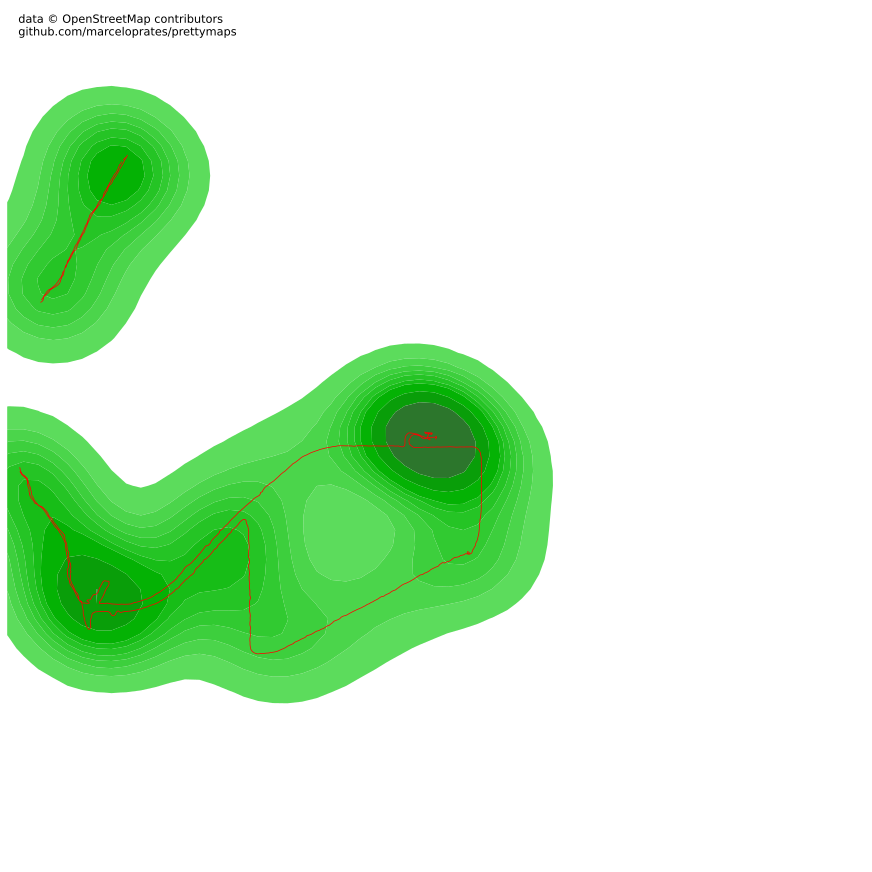

In [ ]:
fig, ax = plt.subplots(figsize = (12, 12), constrained_layout = True)

def postprocessing(layers):
  return layers

layers = plot(
    (29.54559,-98.62181), radius = 1100,
    ax = ax,
    heat_map = True,
    postprocessing = postprocessing,
    layers = {
            'perimeter': {},
            'gpx': {'tags':{'gpx_file':'/content/drive/MyDrive/Afternoon_Walk.gpx','heat_map': True}},
            'gpx': {'tags':{'gpx_file':'/content/drive/MyDrive/Afternoon_Walk2.gpx','heat_map': True}},
            'gpx': {'tags':{'gpx_file':'/content/drive/MyDrive/Evening_Ride (2).gpx','heat_map': True}},
        },
        drawing_kwargs = {
            'perimeter': {'fill': False, 'lw': 0, 'zorder': 0},
            #'gpx': {'fc': '#FF0000', 'ec': '#475657', 'alpha': 1, 'lw': 5, 'zorder': 3, 'path_effects': [path_effects.SimpleLineShadow(),path_effects.Normal()]},
            #'gpxx': {'fc': '#FF0000', 'ec': '#475657', 'alpha': 1, 'lw': 10, 'zorder': 3, 'path_effects': [path_effects.PathPatchEffect(offset=(4, -4), hatch='xxxx', facecolor='gray'),path_effects.PathPatchEffect(edgecolor='white', linewidth=1.1, facecolor='black')]},
            #'gpxx': {'fc': '#FF0000', 'ec': '#475657', 'alpha': 1, 'lw': 0, 'zorder': 3, 'path_effects': [path_effects.Stroke(linewidth=3, foreground='black'),path_effects.Normal()]},
            'gpx': {'fc': '#FF0000', 'ec': '#475657', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'heat_map':{'color': 'green', 'shade' : True, 'gridsize':50, 'legend': True, 'ax': ax, 'palette': ['#FFC857', '#E9724C', '#C5283D']}#https://seaborn.pydata.org/generated/seaborn.kdeplot.html
        }
)

/usr/local/lib/python3.7/dist-packages/prettymaps/fetch.py:251: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in t:
/usr/local/lib/python3.7/dist-packages/prettymaps/draw.py:111: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  layers = dict(zip(k, v))
/usr/local/lib/python3.7/dist-packages/prettymaps/draw.py:292: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in layers[layer]:
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.1

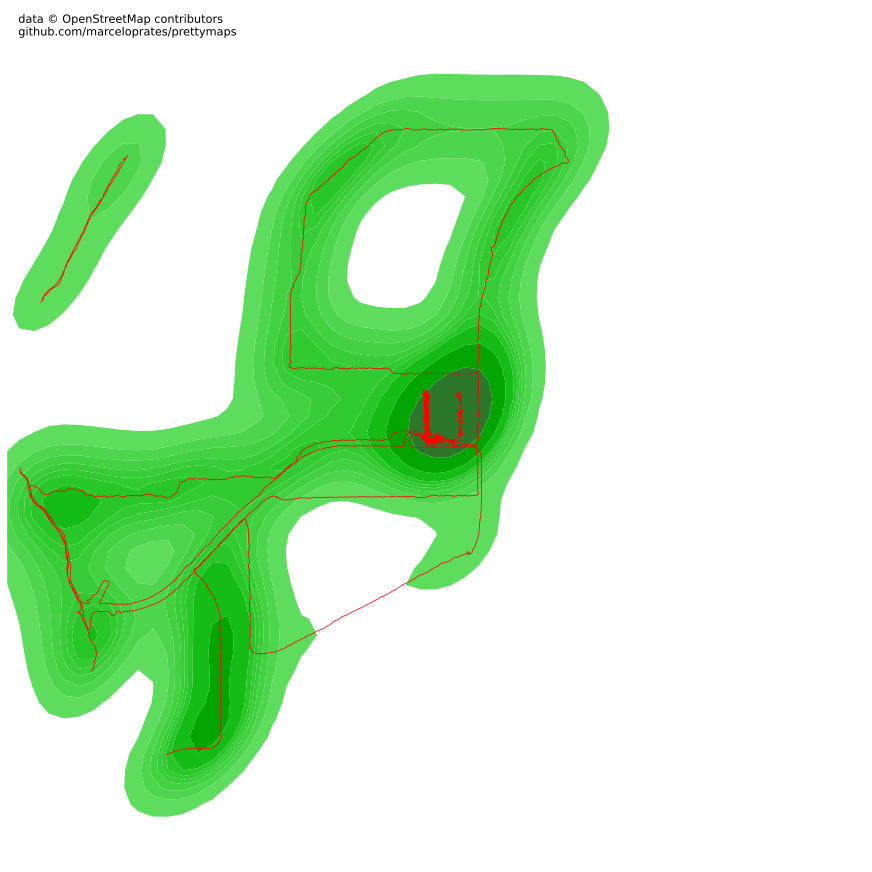

In [ ]:
fig, ax = plt.subplots(figsize = (12, 12), constrained_layout = True)

def postprocessing(layers):
  return layers

layers = plot(
    (29.54559,-98.62181), radius = 1100,
    ax = ax,
    heat_map = True,
    postprocessing = postprocessing,
    layers = {
            'perimeter': {},
            'gpx': {'tags':{'gpx_file':'/content/drive/MyDrive/*.gpx', 'limit': 10, 'heat_map': True}},
        },
        drawing_kwargs = {
            'perimeter': {'fill': False, 'lw': 0, 'zorder': 0},
            'gpx': {'fc': '#FF0000', 'ec': '#475657', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'heat_map':{'color': 'green', 'shade' : True, 'gridsize':50, 'legend': True, 'ax': ax, 'palette': ['#FFC857', '#E9724C', '#C5283D']}#https://seaborn.pydata.org/generated/seaborn.kdeplot.html
        }
)

In [ ]:
fig, ax = plt.subplots(figsize = (12, 12), constrained_layout = True)

def postprocessing(layers):
  print(layers['water']);
  return layers

layers = plot(
    (29.54559,-98.62181), radius = 2200,
    ax = ax,
    postprocessing = postprocessing,
    heat_map = True,
    layers = {
            'perimeter': {},
            'streets': {
                'custom_filter': '["highway"~"motorway|trunk|primary|secondary|tertiary|residential|service|unclassified|pedestrian|footway"]',
                'width': {
                    'motorway': 5,
                    'trunk': 5,
                    'primary': 4.5,
                    'secondary': 4,
                    'tertiary': 3.5,
                    'residential': 3,
                    'service': 2,
                    'unclassified': 2,
                    'pedestrian': 2,
                    'footway': 1,
                }
            },
            'building': {'tags': {'building': True, 'landuse': 'construction'}, 'union': False},
            'water': {'tags': {'natural': ['water', 'bay']}},
            'green': {'tags': {'landuse': 'grass', 'natural': ['island', 'wood'], 'leisure': 'park'}},
            'forest': {'tags': {'landuse': 'forest'}},
            'gpx': {'tags':{'gpx_file':'/content/drive/MyDrive/Afternoon_Walk.gpx','heat_map': True}},
            'gpx2': {'tags':{'gpx_file':'/content/drive/MyDrive/Afternoon_Walk2.gpx','heat_map': True}},
            'parking': {'tags': {'amenity': 'parking', 'highway': 'pedestrian', 'man_made': 'pier'}}
        },
        drawing_kwargs = {
            'background': {'fc': '#F2F4CB', 'ec': '#dadbc1', 'hatch': 'ooo...', 'zorder': -1},
            'perimeter': {'fc': '#F2F4CB', 'ec': '#dadbc1', 'lw': 0, 'hatch': 'ooo...',  'zorder': 0},
            'green': {'fc': '#D0F1BF', 'ec': '#2F3737', 'lw': 1, 'zorder': 1},
            'forest': {'fc': '#64B96A', 'ec': '#2F3737', 'lw': 1, 'zorder': 1},
            'water': {'fc': '#a1e3ff', 'ec': '#2F3737', 'hatch': 'ooo...', 'hatch_c': '#85c9e6', 'lw': 1, 'zorder': 2},
            'parking': {'fc': '#F2F4CB', 'ec': '#2F3737', 'lw': 1, 'zorder': 3},
            'streets': {'fc': '#2F3737', 'ec': '#475657', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'gpx': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 3, 'zorder': 4},
            'gpx2': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 3, 'zorder': 4},
            'coastline': {'fc': '#FF0000', 'ec': '#FF0000', 'alpha': 1, 'lw': 0, 'zorder': 7},
            'building': {'palette': ['#FFC857', '#E9724C', '#C5283D'], 'ec': '#2F3737', 'lw': .5, 'zorder': 2},
            'streets': {'fc': '#2F3737', 'ec': '#475657', 'alpha': 1, 'lw': 0, 'zorder': 3},
            'heat_map':{'color': 'green', 'shade' : True, 'gridsize':50, 'legend': True, 'ax': ax, 'palette': ['#FFC857', '#E9724C', '#C5283D'],'zorder': 3},
        }
)

/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/lib/python3.7/dist-packages/prettymaps/fetch.py:422: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated a

MULTIPOLYGON (((535768.6057777349 3268092.514105294, 535766.3441738072 3268087.698081912, 535763.6141842997 3268080.875041794, 535761.4092308701 3268076.524570948, 535757.4630238839 3268071.304308983, 535753.3106022993 3268066.947654884, 535750.8385537036 3268064.32486059, 535749.6350786851 3268061.916620042, 535742.7848300347 3268061.961352313, 535771.3693996012 3268110.096199055, 535777.0294706416 3268106.502014881, 535768.6057777349 3268092.514105294)), ((538078.8270968185 3268627.169870244, 538062.0286933271 3268669.705775339, 538040.825068327 3268731.451160165, 538036.6127634502 3268748.013073226, 538037.0805445772 3268755.804114139, 538046.8927227991 3268759.316495153, 538050.0602348201 3268759.493407061, 538056.0707408739 3268755.535894405, 538067.2753964298 3268742.643056929, 538087.3549191765 3268715.364769462, 538110.4755201159 3268676.994339617, 538131.9134268672 3268640.612712977, 538157.2173116989 3268595.62374809, 538171.1129785759 3268574.950675553, 538182.7787596377 326

/usr/local/lib/python3.7/dist-packages/descartes/patch.py:65: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  for t in polygon])
/usr/local/lib/python3.7/dist-packages/prettymaps/draw.py:79: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for shape in shapes:


/usr/local/lib/python3.7/dist-packages/descartes/patch.py:65: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  for t in polygon])


TypeError: ignored

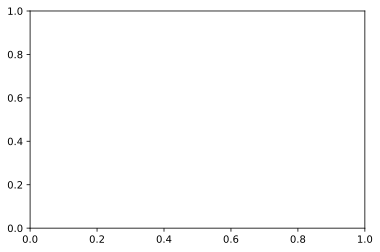

In [ ]:
import fiona
fiona.listlayers('/content/drive/MyDrive/Afternoon_Walk.gpx')
[u'waypoints', u'routes', u'tracks', u'route_points', u'track_points']
# open layer tracks
layer = fiona.open('/content/drive/MyDrive/Afternoon_Walk.gpx', layer='tracks')
geom = layer[0] # only one feature here)
geom['geometry']['type']
'MultiLineString'
# convert to shapely geometry
from shapely.geometry import shape, mapping
tracks = shape(geom['geometry'])
tracks


polygs = {'type': 'Polygon', 'coordinates': [[(-79.159610379971326, 35.615399458474776), (-79.153546268732796, 35.615411586697256), (-79.153109652723629, 35.611215221720187), (-79.159392071966749, 35.611118195940371), (-79.159610379971326, 35.615399458474776)]]}
poly = shape(polygs)


geometry = poly.intersection(tracks)
mapping(geometry)['type']
'MultiLineString'

import matplotlib.pyplot as plt
from descartes.patch import PolygonPatch
def plot_poly(ax,ob):
   patch = PolygonPatch(ob, facecolor='#6699cc', edgecolor='#6699cc')
   ax.add_patch(patch)
def plot_line(ax, ob, col):
   x, y = ob.xy
   ax.plot(x, y, color=col)
def plot_multiline(ax, ob,col):
   for line in ob:
      plot_line(ax,line,col)

fig = plt.figure() 
ax = fig.gca()
#plot_multiline(ax, tracks,'b')
plot_poly(ax,poly)
plot_multiline(ax, geometry,'r')


In [ ]:
import fiona; help(fiona.open)

In [ ]:
# General style parameters
palette = ['#433633', '#FF5E5B']
background_c = '#F2F4CB'
dilate = 100

# Setup plot
fig, ax = plt.subplots(figsize = (12, 12), constrained_layout = True)

layers = plot(
    'Albany, Texas', radius = 2000,
    ax = ax,
    
    layers = {
            'perimeter': {},
            'streets': {
                'width': {
                    'motorway': 5,
                    'trunk': 5,
                    'primary': 4.5,
                    'secondary': 4,
                    'tertiary': 3.5,
                    'cycleway': 3.5,
                    'residential': 3,
                    'service': 2,
                    'unclassified': 2,
                    'pedestrian': 2,
                    'footway': 1,
                },
                'circle': False, 'dilate': dilate
            },
            'building': {'tags': {'building': True, 'landuse': 'construction'}, 'union': True, 'circle': False, 'dilate': dilate},
            'water': {'tags': {'natural': ['water', 'bay']}, 'circle': False, 'dilate': dilate},
            'forest': {'tags': {'landuse': 'forest'}, 'circle': False, 'dilate': dilate},
            'green': {'tags': {'landuse': ['grass', 'orchard'], 'natural': ['island', 'wood'], 'leisure': 'park'}, 'circle': False, 'dilate': dilate},
            'beach': {'tags': {'natural': 'beach'}, 'circle': False, 'dilate': dilate},
            'parking': {'tags': {'amenity': 'parking', 'highway': 'pedestrian', 'man_made': 'pier'}, 'circle': False},
            'golf_course':        {'tags': {'leisure': 'golf_course'}},
            'golf_bunker':        {'tags': {'golf': 'bunker'}},
            'golf_fairway':       {'tags': {'golf': 'fairway'}},
            'golf_rough':         {'tags': {'golf': 'rough'}},
            'golf_green':         {'tags': {'golf': 'green'}},
            'golf_hole':          {'tags': {'golf': 'hole'}},
            'golf_tee':           {'tags': {'golf': 'tee'}},
            'golf_driving_range': {'tags': {'golf': 'driving_range'}},
        },
        drawing_kwargs = {
            'perimeter': {'fill': False, 'lw': 0, 'zorder': 0},
            'background': {'fc': background_c, 'zorder': -1},
            'green': {'fc': '#8BB174', 'ec': '#2F3737', 'hatch_c': '#A7C497', 'hatch': 'ooo...', 'lw': 1, 'zorder': 1},
            'forest': {'fc': '#64B96A', 'ec': '#2F3737', 'lw': 1, 'zorder': 2},
            'water': {'fc': '#a8e1e6', 'ec': '#2F3737', 'hatch_c': '#9bc3d4', 'hatch': 'ooo...', 'lw': 1, 'zorder': 3},
            'beach': {'fc': '#FCE19C', 'ec': '#2F3737', 'hatch_c': '#d4d196', 'hatch': 'ooo...', 'lw': 1, 'zorder': 3},
            'parking': {'fc': background_c, 'ec': '#2F3737', 'lw': 1, 'zorder': 3},
            'streets': {'fc': '#2F3737', 'ec': '#475657', 'alpha': 1, 'lw': 0, 'zorder': 4},
            'building': {'palette': palette, 'ec': '#2F3737', 'lw': .5, 'zorder': 5},
            'golf_rough':            {'fc': '#C6E8A7', 'ec': '#B1DE89', 'lw': 0, 'zorder': 1,                'hatch': '......'},
            'golf_fairway':          {'fc': '#CDEBB0', 'ec': '#CDEBB0', 'lw': 0, 'zorder': 2},
            'golf_driving_range':    {'fc': '#AAE0CB', 'ec': '#EBD499', 'lw': 0, 'zorder': 2},
            'golf_green':            {'fc': '#AAE0CB', 'ec': '#AAE0CB', 'lw': 0, 'zorder': 4},
            'golf_bunker':           {'fc': '#F5E9C6', 'ec': '#F5E9C6', 'lw': 0, 'zorder': 4},
            'golf_tee':              {'fc': '#CDEBB0', 'ec': '#CDEBB0', 'lw': 0, 'zorder': 4},
            'golf_hole':             {'fc': '#FF0000', 'ec': '#FF0000', 'lw': 1, 'zorder': 7},
            'heat_map':{'color': 'green', 'shade' : True, 'gridsize':50, 'legend': True, 'ax': ax, 'palette': ['#FFC857', '#E9724C', '#C5283D']}
            
        },

        osm_credit = {'x': .405, 'y': .68, 'color': '#2F3737'}
)

# Set bounds
xmin, ymin, xmax, ymax = layers['perimeter'].bounds
dx, dy = xmax-xmin, ymax-ymin
a = .2
ax.set_xlim(xmin+a*dx, xmax-a*dx)
ax.set_ylim(ymin+a*dy, ymax-a*dy)

ax.text(
    xmin+.39*dx, ymin+.305*dy,
    ' '*3 + 'Albany, Texas',
    color = '#FF0000',
    zorder = 6, rotation = +1.75,
    fontproperties = fm.FontProperties(fname = '../assets/Permanent_Marker/PermanentMarker-Regular.ttf', size = 24)
)

#plt.savefig('../prints/heerhugowaard.png')

/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/lib/python3.7/dist-packages/prettymaps/fetch.py:437: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated a

Text(471955.3097473767, 3620400.00614973, '   Albany, Texas')


# of features:
--------------
 1
Feature attribute data:
-----------------------
name: Afternoon Walk
cmt: None
desc: None
src: None
link1_href: None
link1_text: None
link1_type: None
link2_href: None
link2_text: None
link2_type: None
number: None
type: 10


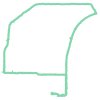

In [ ]:

fname = '/content/drive/MyDrive/Afternoon_Walk.gpx'
# Open tracks layer
tracks_layer = fiona.open(fname, layer='tracks')
(feature) = tracks_layer[0]
print()
# Print out the number of features in the tracks layer
print("# of features:\n--------------\n", len(list(tracks_layer.items())))

# Print out fields and attribute data
properties = feature['properties']
print("Feature attribute data:\n-----------------------")
for k, v in properties.items():
    print('{}: {}'.format(k,v))

# Draw a quick plot of data using shapely
from shapely.geometry import shape
tracks_data = {'type': 'MultiLineString',
               'coordinates': feature['geometry']['coordinates']}
tracks_shape = shape(tracks_data)
tracks_shape


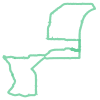

In [ ]:
from shapely.geometry import shape
from shapely.ops import polygonize
import pprint
fnames = ['/content/drive/MyDrive/Afternoon_Walk.gpx','/content/drive/MyDrive/Afternoon_Walk2.gpx']
shapes = []
for fname in fnames:
  tracks_layer = fiona.open(fname, layer='tracks')
  (feature) = tracks_layer[0]
  tracks_data = {'type': 'MultiLineString',
               'coordinates': feature['geometry']['coordinates']}
  tracks_shape = shape(tracks_data)
  shapes.append(tracks_shape)

plott = None
if(len(shapes) == 1):
  plott = shapes[0]
else:
  plott = shapes[0]
  i = 1
  while i < len(shapes):
    plott = plott.union(shapes[i])
    i += 1

plott

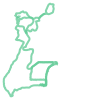

In [ ]:
from shapely.geometry import shape
from shapely.ops import polygonize
import pprint
import os
fnames = os.listdir('/content/drive/MyDrive/strava_export/activities')
shapes = []
max_files = 15
i = 0
for fname in fnames:
  if max_files == i:
    break
  i = i + 1
  if fname.endswith('.gpx'):
    tracks_layer = fiona.open('/content/drive/MyDrive/strava_export/activities/' + fname, layer='tracks')
    (feature) = tracks_layer[0]
    tracks_data = {'type': 'MultiLineString',
                'coordinates': feature['geometry']['coordinates']}
    tracks_shape = shape(tracks_data)
    shapes.append(tracks_shape)

plott = None
if(len(shapes) == 1):
  plott = shapes[0]
else:
  plott = shapes[0]
  i = 1
  while i < len(shapes):
    plott = plott.union(shapes[i])
    i += 1

plott

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/shapely/figures.py:51: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  x, y = zip(*list((p.x, p.y) for p in ob.boundary))
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.


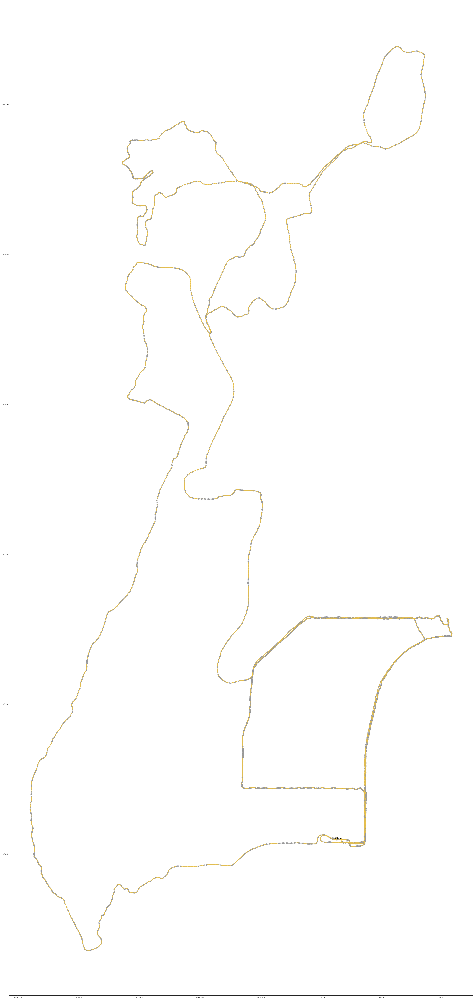

In [ ]:
from shapely.geometry import shape
from shapely.ops import polygonize
import pprint
import os
from matplotlib import pyplot
from shapely.geometry import LineString
from matplotlib import pyplot
from shapely.geometry import MultiLineString

from shapely.figures import SIZE, set_limits, plot_line, plot_bounds, color_issimple
from shapely.figures import plot_coords as _plot_coords

from shapely.figures import SIZE, set_limits, plot_coords, plot_bounds, plot_line_issimple

def plot_coords(ax, ob):
    for line in ob:
        _plot_coords(ax, line, zorder=1)

def plot_lines(ax, ob):
    color = color_issimple(ob)
    for line in ob:
        plot_line(ax, line, color=color, alpha=0.7, zorder=2)

fig = pyplot.figure(1, figsize=(100,100), dpi=90)

# 1: disconnected multilinestring
ax = fig.add_subplot(121)




fnames = os.listdir('/content/drive/MyDrive/strava_export/activities')
shapes = []
max_files = 15
i = 0
for fname in fnames:
  if max_files == i:
    break
  i = i + 1
  if fname.endswith('.gpx'):
    tracks_layer = fiona.open('/content/drive/MyDrive/strava_export/activities/' + fname, layer='tracks')
    (feature) = tracks_layer[0]
    tracks_data = {'type': 'MultiLineString',
                'coordinates': feature['geometry']['coordinates']}
    tracks_shape = shape(tracks_data)
    shapes.append(tracks_shape)

plott = None
if(len(shapes) == 1):
  plott = shapes[0]
else:
  plott = shapes[0]
  i = 1
  while i < len(shapes):
    plott = plott.union(shapes[i])
    i += 1

plot_coords(ax, plott)
plot_bounds(ax, plott)
plot_lines(ax, plott)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/shapely/figures.py:51: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  x, y = zip(*list((p.x, p.y) for p in ob.boundary))
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.


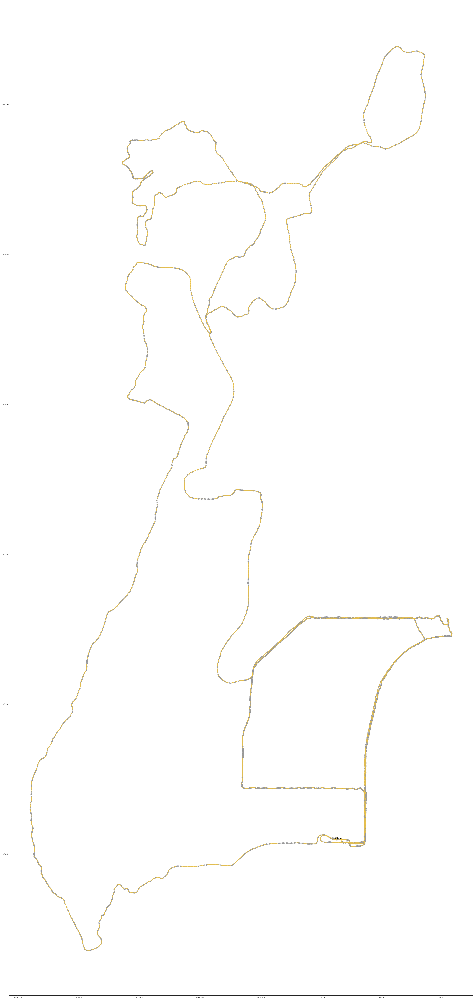

In [ ]:
from shapely.geometry import shape
from shapely.ops import polygonize
import pprint
import os
from matplotlib import pyplot
from shapely.geometry import LineString
from matplotlib import pyplot
from shapely.geometry import MultiLineString
from shapely.ops import unary_union
from shapely.figures import SIZE, set_limits, plot_line, plot_bounds, color_issimple
from shapely.figures import plot_coords as _plot_coords

from shapely.figures import SIZE, set_limits, plot_coords, plot_bounds, plot_line_issimple

def plot_coords(ax, ob):
    for line in ob:
        _plot_coords(ax, line, zorder=1)

def plot_lines(ax, ob):
    color = color_issimple(ob)
    for line in ob:
        plot_line(ax, line, color=color, alpha=0.7, zorder=2)

fig = pyplot.figure(1, figsize=(100,100), dpi=90)

# 1: disconnected multilinestring
ax = fig.add_subplot(121)

fnames = os.listdir('/content/drive/MyDrive/strava_export/activities')
shapes = []
max_files = 15
i = 0
for fname in fnames:
  if max_files == i:
    break
  i = i + 1
  if fname.endswith('.gpx'):
    tracks_layer = fiona.open('/content/drive/MyDrive/strava_export/activities/' + fname, layer='tracks')
    (feature) = tracks_layer[0]
    tracks_data = {'type': 'MultiLineString',
                'coordinates': feature['geometry']['coordinates']}
    tracks_shape = shape(tracks_data)
    shapes.append(tracks_shape)

plott = unary_union(shapes)
plot_coords(ax, plott)
plot_bounds(ax, plott)
plot_lines(ax, plott)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
/usr/local/lib/python3.7/dist-packages/shapely/figures.py:51: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  x, y = zip(*list((p.x, p.y) for p in ob.boundary))
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.


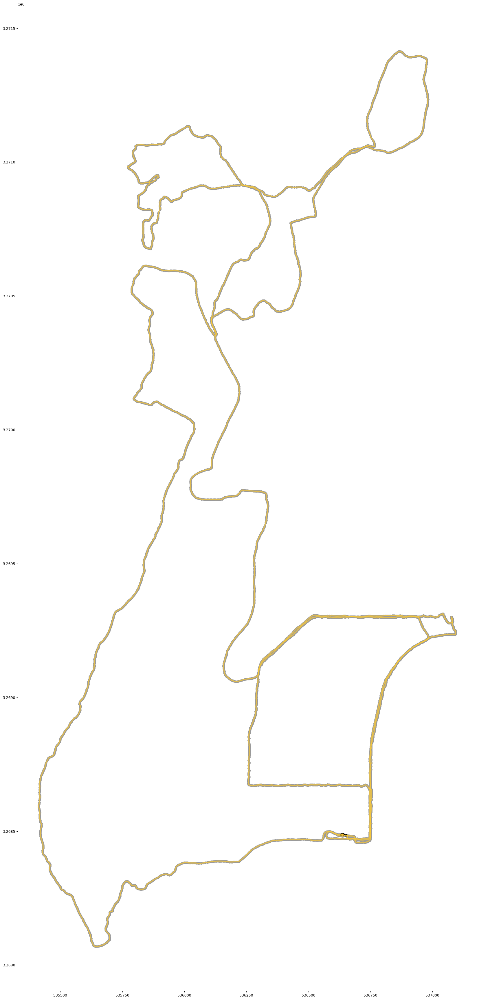

In [ ]:
from shapely.geometry import shape
from shapely.ops import polygonize
import pprint
import os
from matplotlib import pyplot
from shapely.geometry import LineString
from matplotlib import pyplot
from shapely.geometry import MultiLineString
from shapely.ops import unary_union
from shapely.figures import SIZE, set_limits, plot_line, plot_bounds, color_issimple
from shapely.figures import plot_coords as _plot_coords
import osmnx as ox
import geopandas as gpd

from shapely.figures import SIZE, set_limits, plot_coords, plot_bounds, plot_line_issimple

def plot_coords(ax, ob):
    for line in ob:
        _plot_coords(ax, line, zorder=1)

def plot_lines(ax, ob):
    color = color_issimple(ob)
    for line in ob:
        plot_line(ax, line, color=color, alpha=0.7, zorder=2)

fig = pyplot.figure(1, figsize=(50,50), dpi=90)

# 1: disconnected multilinestring
ax = fig.add_subplot(121)

fnames = os.listdir('/content/drive/MyDrive/strava_export/activities')
fnames = ['gpx_geometries']
shapes = []
max_files = 15
i = 0
for fname in fnames:
  if max_files == i:
    break
  i = i + 1
  if fname.endswith('.gpx'):
    tracks_layer = gpd.read_file('/content/drive/MyDrive/strava_export/activities/' + fname, layer='tracks')
    tracks_layer.set_crs(crs="EPSG:4326")
    tracks_layer = ox.project_gdf(tracks_layer)
    tracks_shape = shape(tracks_layer['geometry'][0])
    shapes.append(tracks_shape)

plott = unary_union(shapes)
plot_coords(ax, plott)
plot_bounds(ax, plott)
plot_lines(ax, plott)

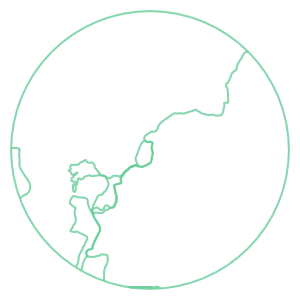

In [ ]:
from shapely.geometry import shape
from shapely.ops import polygonize
import pprint
import os
from matplotlib import pyplot
from shapely.geometry import LineString
from matplotlib import pyplot
from shapely.geometry import MultiLineString
from shapely.ops import unary_union
from shapely.figures import SIZE, set_limits, plot_line, plot_bounds, color_issimple
from shapely.figures import plot_coords as _plot_coords
import osmnx as ox
import geopandas as gpd
from typing import Optional, Union, Tuple
from shapely.figures import SIZE, set_limits, plot_coords, plot_bounds, plot_line_issimple
from tokenize import Number, String
from xmlrpc.client import Boolean
from geopandas import GeoDataFrame, read_file
from shapely.geometry import Point, Polygon, MultiPolygon, LineString, MultiLineString

def plot_coords(ax, ob):
    for line in ob:
        _plot_coords(ax, line, zorder=1)

def plot_lines(ax, ob):
    color = color_issimple(ob)
    for line in ob:
        plot_line(ax, line, color=color, alpha=0.7, zorder=2)

def get_boundary(
    point: Tuple, radius: float, crs: String, circle: Boolean = True, dilate: float = 0
) -> Polygon:
    if circle:
        return (
            ox.project_gdf(GeoDataFrame(geometry=[Point(point[::-1])], crs=crs))
            .geometry[0]
            .buffer(radius)
        )
    else:
        x, y = np.stack(
            ox.project_gdf(GeoDataFrame(geometry=[Point(point[::-1])], crs=crs))
            .geometry[0]
            .xy
        )
        r = radius
        return Polygon(
            [(x - r, y - r), (x + r, y - r), (x + r, y + r), (x - r, y + r)]
        ).buffer(dilate)

boundary = get_boundary((29.5707, -98.6186),2000,crs="EPSG:4326")
#fig = pyplot.figure(1, figsize=(50,50), dpi=90)

# 1: disconnected multilinestring
#ax = fig.add_subplot(121)

fnames = os.listdir('/content/drive/MyDrive/strava_export/activities')
shapes = []
max_files = 150
i = 0
for fname in fnames:
  if max_files == i:
    break
  i = i + 1
  if fname.endswith('.gpx'):
    tracks_layer = gpd.read_file('/content/drive/MyDrive/strava_export/activities/' + fname, layer='tracks')
    tracks_layer.set_crs(crs="EPSG:4326")
    tracks_layer = ox.project_gdf(tracks_layer)
    tracks_shape = shape(tracks_layer['geometry'][0])
    shapes.append(tracks_shape)

shapes.append(boundary.boundary)
plott = unary_union(shapes)
#boundary.boundary.intersection(plott)
plott = plott.intersection(boundary)
plott
#print(plott)
#plot_coords(ax, plott)
#plot_bounds(ax, plott)
#plot_lines(ax, plott)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
/usr/local/lib/python3.7/dist-packages/shapely/figures.py:51: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  x, y = zip(*list((p.x, p.y) for p in ob.boundary))
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.


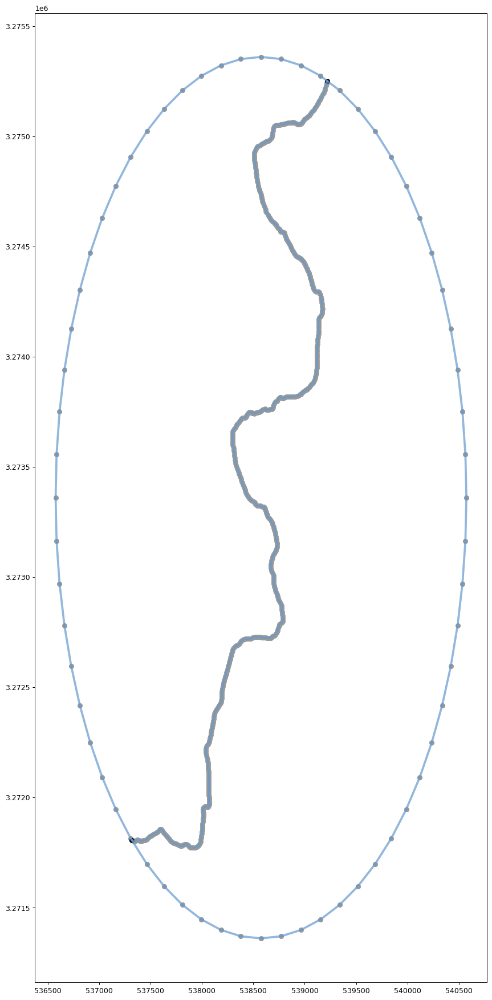

In [ ]:
from shapely.geometry import shape
from shapely.ops import polygonize
import pprint
import os
from matplotlib import pyplot
from shapely.geometry import LineString
from matplotlib import pyplot
from shapely.geometry import MultiLineString
from shapely.ops import unary_union
from shapely.figures import SIZE, set_limits, plot_line, plot_bounds, color_issimple
from shapely.figures import plot_coords as _plot_coords
import osmnx as ox
import geopandas as gpd
from typing import Optional, Union, Tuple
from shapely.figures import SIZE, set_limits, plot_coords, plot_bounds, plot_line_issimple
from tokenize import Number, String
from xmlrpc.client import Boolean
from geopandas import GeoDataFrame, read_file
from shapely.geometry import Point, Polygon, MultiPolygon, LineString, MultiLineString

def plot_coords(ax, ob):
    for line in ob:
        _plot_coords(ax, line, zorder=1)

def plot_lines(ax, ob):
    color = color_issimple(ob)
    for line in ob:
        plot_line(ax, line, color=color, alpha=0.7, zorder=2)

def get_boundary(
    point: Tuple, radius: float, crs: String, circle: Boolean = True, dilate: float = 0
) -> Polygon:
    if circle:
        return (
            ox.project_gdf(GeoDataFrame(geometry=[Point(point[::-1])], crs=crs))
            .geometry[0]
            .buffer(radius)
        )
    else:
        x, y = np.stack(
            ox.project_gdf(GeoDataFrame(geometry=[Point(point[::-1])], crs=crs))
            .geometry[0]
            .xy
        )
        r = radius
        return Polygon(
            [(x - r, y - r), (x + r, y - r), (x + r, y + r), (x - r, y + r)]
        ).buffer(dilate)

boundary = get_boundary((29.58945, -98.60168),2000,crs="EPSG:4326")
fig = pyplot.figure(1, figsize=(25,25), dpi=90)

# 1: disconnected multilinestring
ax = fig.add_subplot(121)

fnames = os.listdir('/content/drive/MyDrive/strava_export/activities')
shapes = []
max_files = 100
i = 0
for fname in fnames:
  if max_files == i:
    break
  i = i + 1
  if fname.endswith('.gpx'):
    tracks_layer = gpd.read_file('/content/drive/MyDrive/strava_export/activities/' + fname, layer='tracks')
    tracks_layer.set_crs(crs="EPSG:4326")
    tracks_layer = ox.project_gdf(tracks_layer)
    tracks_shape = shape(tracks_layer['geometry'][0])
    shapes.append(tracks_shape)

shapes.append(boundary.boundary)
plott = unary_union(shapes)
#boundary.boundary.intersection(plott)
plott = plott.intersection(boundary)
plott
#print(plott)
plot_coords(ax, plott)
plot_bounds(ax, plott)
plot_lines(ax, plott)

In [ ]:
from shapely.geometry import shape
from shapely.ops import polygonize
import pprint
import os
from matplotlib import pyplot
from shapely.figures import BLUE, GRAY, YELLOW, GREEN, SIZE, set_limits, plot_coords
import fiona 
from shapely.geometry import Polygon
from shapely.geometry import MultiPolygon
from shapely.geometry import MultiLineString
from descartes import PolygonPatch

fnames = os.listdir('/content/drive/MyDrive/strava_export/activities')
shapes = []
max_files = 15
i = 0
for fname in fnames:
  if max_files == i:
    break
  i = i + 1
  if fname.endswith('.gpx'):
    tracks_layer = fiona.open('/content/drive/MyDrive/strava_export/activities/' + fname, layer='tracks')
    (feature) = tracks_layer[0]
    tracks_data = {'type': 'MultiLineString',
                'coordinates': feature['geometry']['coordinates']}
    tracks_shape = shape(tracks_data)
    shapes.append(tracks_shape)

plott = None
if(len(shapes) == 1):
  plott = shapes[0]
else:
  plott = shapes[0]
  i = 1
  while i < len(shapes):
    plott = plott.union(shapes[i])
    i += 1

ax = fig.add_subplot(121)
print(plott.geom_type)
print(len(plott.geoms))
print(plott.geoms[0].geom_type)
print(Polygon(plott.geoms[0]))

polygons = []
i = 0
for line in plott.geoms:
  if len(plott.geoms[i].coords) >= 3:
    polygons.append(Polygon(plott.geoms[i]))
  i = i + 1

print(MultiPolygon(polygons).bounds)
mp = MultiPolygon(polygons)
mp = mp.buffer(0.5)
print(mp.xy)
#mp.xy = ( mp.bounds[0],mp.bounds[1] )
patch1 = PolygonPatch(mp, fc=GRAY, ec=GRAY, alpha=0.2, zorder=1)
plot_coords(ax, patch1)

fig = pyplot.figure(1, figsize=SIZE, dpi=90)

plott

MultiLineString
100
LineString
POLYGON ((-98.621708 29.545512, -98.621696 29.545501, -98.62168800000001 29.545496, -98.621664 29.545504, -98.621645 29.545507, -98.621647 29.545498, -98.62165 29.54549, -98.6216493175632 29.54548464549579, -98.621708 29.545512))
(-98.634479, 29.541787, -98.61711, 29.571932)


NotImplementedError: ignored


# of features:
--------------
 1
Feature attribute data:
-----------------------
name: Afternoon Walk
cmt: None
desc: None
src: None
link1_href: None
link1_text: None
link1_type: None
link2_href: None
link2_text: None
link2_type: None
number: None
type: 10


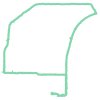

In [ ]:
fname = '/content/drive/MyDrive/Afternoon_Walk.gpx'
# Open tracks layer
tracks_layer = fiona.open(fname, layer='tracks')
(feature) = tracks_layer[0]
print()
# Print out the number of features in the tracks layer
print("# of features:\n--------------\n", len(list(tracks_layer.items())))

# Print out fields and attribute data
properties = feature['properties']
print("Feature attribute data:\n-----------------------")
for k, v in properties.items():
    print('{}: {}'.format(k,v))

# Draw a quick plot of data using shapely
from shapely.geometry import shape
tracks_data = {'type': 'MultiLineString',
               'coordinates': feature['geometry']['coordinates']}
tracks_shape = shape(tracks_data)
tracks_shape


[[(-98.621846, 29.545548), (-98.621898, 29.545538), (-98.621915, 29.545544), (-98.621899, 29.545545), (-98.621909, 29.545548), (-98.621903, 29.545548), (-98.621901, 29.545547), (-98.621892, 29.545539), (-98.621888, 29.545548), (-98.62188, 29.545542), (-98.621877, 29.545536), (-98.621882, 29.545549), (-98.621886, 29.545546), (-98.621883, 29.545551), (-98.621871, 29.545559), (-98.621856, 29.545557), (-98.621823, 29.545547), (-98.621802, 29.545543), (-98.621774, 29.545523), (-98.621765, 29.545517), (-98.62177, 29.545512), (-98.621757, 29.545516), (-98.621755, 29.545509), (-98.621739, 29.545521), (-98.621721, 29.545521), (-98.621722, 29.54552), (-98.621708, 29.545516), (-98.621701, 29.545518), (-98.621695, 29.545519), (-98.621683, 29.545515), (-98.621675, 29.545512), (-98.621659, 29.545511), (-98.62165, 29.545511), (-98.621641, 29.545512), (-98.621632, 29.545512), (-98.62162, 29.545515), (-98.621609, 29.545517), (-98.621599, 29.545516), (-98.621596, 29.545518), (-98.621583, 29.545517), (-9

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


AxesSubplot(0.125,0.125;0.775x0.755)


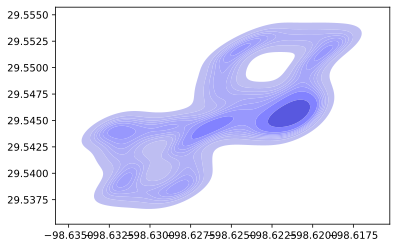

In [ ]:
import seaborn as sn
import matplotlib.pyplot as plt
import numpy as np
import pandas
x = []
y = []
fnames = ['/content/drive/MyDrive/Afternoon_Walk.gpx','/content/drive/MyDrive/Afternoon_Walk2.gpx']
for fname in fnames:
  tracks_layer = fiona.open(fname, layer='tracks')
  (feature) = tracks_layer[0]
  print(feature['geometry']['coordinates'])
  for point in feature['geometry']['coordinates']:
    for i in point:
      x.append(i[0])
      y.append(i[1])

res = sn.kdeplot(x,y,color='blue',shade=True)
print(res)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:78: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.


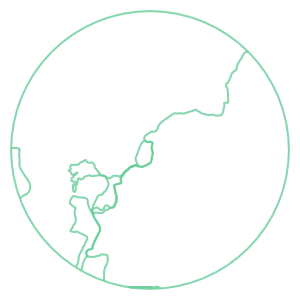

In [ ]:
from shapely.geometry import shape
from shapely.ops import polygonize
import pprint
import os
from matplotlib import pyplot
from shapely.geometry import LineString
from matplotlib import pyplot
from shapely.geometry import MultiLineString
from shapely.ops import unary_union
from shapely.figures import SIZE, set_limits, plot_line, plot_bounds, color_issimple
from shapely.figures import plot_coords as _plot_coords
import osmnx as ox
import geopandas as gpd
from typing import Optional, Union, Tuple
from shapely.figures import SIZE, set_limits, plot_coords, plot_bounds, plot_line_issimple
from tokenize import Number, String
from xmlrpc.client import Boolean
from geopandas import GeoDataFrame, read_file
from shapely.geometry import Point, Polygon, MultiPolygon, LineString, MultiLineString
import seaborn as sn

def plot_coords(ax, ob):
    for line in ob:
        _plot_coords(ax, line, zorder=1)

def plot_lines(ax, ob):
    color = color_issimple(ob)
    for line in ob:
        plot_line(ax, line, color=color, alpha=0.7, zorder=2)

def get_boundary(
    point: Tuple, radius: float, crs: String, circle: Boolean = True, dilate: float = 0
) -> Polygon:
    if circle:
        return (
            ox.project_gdf(GeoDataFrame(geometry=[Point(point[::-1])], crs=crs))
            .geometry[0]
            .buffer(radius)
        )
    else:
        x, y = np.stack(
            ox.project_gdf(GeoDataFrame(geometry=[Point(point[::-1])], crs=crs))
            .geometry[0]
            .xy
        )
        r = radius
        return Polygon(
            [(x - r, y - r), (x + r, y - r), (x + r, y + r), (x - r, y + r)]
        ).buffer(dilate)

boundary = get_boundary((29.5707, -98.6186),2000,crs="EPSG:4326")
#fig = pyplot.figure(1, figsize=(50,50), dpi=90)

# 1: disconnected multilinestring
#ax = fig.add_subplot(121)

fnames = os.listdir('/content/drive/MyDrive/strava_export/activities')

shapes = []
max_files = 15
i = 0
for fname in fnames:
  if max_files == i:
    break
  i = i + 1
  if fname.endswith('.gpx'):
    tracks_layer = gpd.read_file('/content/drive/MyDrive/strava_export/activities/' + fname, layer='tracks')
    tracks_layer.set_crs(crs="EPSG:4326")
    tracks_layer = ox.project_gdf(tracks_layer)
    tracks_shape = shape(tracks_layer['geometry'][0])
    shapes.append(tracks_shape)

xs = []
ys = []
heatmap = None
for shape in shapes:
  shape
  for x,y in shape[0].coords:
    xs.append(x)
    ys.append(y)

#res = sn.kdeplot(xs,ys,color='blue',shade=True,ax=ax)

shapes.append(boundary.boundary)
plott = unary_union(shapes)
#boundary.boundary.intersection(plott)
plott = plott.intersection(boundary)
plott
#print(plott)
#plot_coords(ax, plott)
#plot_bounds(ax, plott)
#plot_lines(ax, plott)

{'type': 'MultiLineString', 'coordinates': [[(-98.621846, 29.545548), (-98.621898, 29.545538), (-98.621915, 29.545544), (-98.621899, 29.545545), (-98.621909, 29.545548), (-98.621903, 29.545548), (-98.621901, 29.545547), (-98.621892, 29.545539), (-98.621888, 29.545548), (-98.62188, 29.545542), (-98.621877, 29.545536), (-98.621882, 29.545549), (-98.621886, 29.545546), (-98.621883, 29.545551), (-98.621871, 29.545559), (-98.621856, 29.545557), (-98.621823, 29.545547), (-98.621802, 29.545543), (-98.621774, 29.545523), (-98.621765, 29.545517), (-98.62177, 29.545512), (-98.621757, 29.545516), (-98.621755, 29.545509), (-98.621739, 29.545521), (-98.621721, 29.545521), (-98.621722, 29.54552), (-98.621708, 29.545516), (-98.621701, 29.545518), (-98.621695, 29.545519), (-98.621683, 29.545515), (-98.621675, 29.545512), (-98.621659, 29.545511), (-98.62165, 29.545511), (-98.621641, 29.545512), (-98.621632, 29.545512), (-98.62162, 29.545515), (-98.621609, 29.545517), (-98.621599, 29.545516), (-98.62159

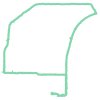

In [ ]:
fname = '/content/drive/MyDrive/Afternoon_Walk.gpx'
# Open tracks layer
tracks_layer = fiona.open(fname, layer='tracks')
feature = tracks_layer[0]
print(feature['geometry'])
# Print out the number of features in the tracks layer
print("# of features:\n--------------\n", len(list(tracks_layer.items())))

# Print out fields and attribute data
properties = feature['properties']
print("Feature attribute data:\n-----------------------")
for k, v in properties.items():
    print('{}: {}'.format(k,v))

b = fiona.open(fname)
for x in b.keys():
  print(x)
print("Geometry attribute data:\n-----------------------")
for k, v in feature['geometry'].items():
    print('{}: {}'.format(k,v))

# Draw a quick plot of data using shapely
from shapely.geometry import shape
tracks_data = {'type': 'MultiLineString',
               'coordinates': feature['geometry']['coordinates']}
tracks_shape = shape(tracks_data)
tracks_shape


# of features:
--------------
 2360
Feature attribute data:
-----------------------
track_fid: 0
track_seg_id: 0
track_seg_point_id: 0
ele: 278.7
time: 2022-01-23T23:59:39+00:00
magvar: None
geoidheight: None
name: None
cmt: None
desc: None
src: None
link1_href: None
link1_text: None
link1_type: None
link2_href: None
link2_text: None
link2_type: None
sym: None
type: None
fix: None
sat: None
hdop: None
vdop: None
pdop: None
ageofdgpsdata: None
dgpsid: None


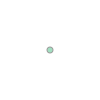

In [ ]:
# Open track points layer
track_pts_layer = fiona.open('/content/drive/MyDrive/Afternoon_Walk.gpx', layer='track_points')
feature = track_pts_layer[0]

# Print out the number of features in the tracks layer
print("# of features:\n--------------\n", len(list(track_pts_layer.items())))

# Print out fields and attribute data
properties = feature['properties']
print("Feature attribute data:\n-----------------------")
for k, v in properties.items():
      print('{}: {}'.format(k,v))

# Draw a quick plot of data using shapely
track_pt_data = {'type': 'Point',
               'coordinates': feature['geometry']['coordinates']}
track_pt_shape = shape(track_pt_data)
track_pt_shape

In [ ]:
fname = '/content/drive/MyDrive/Afternoon_Walk.gpx'
# Open tracks layer
tracks_layer = fiona.open(fname, layer='tracks',crs_wkt=dict(ellps='WGS84', datum='WGS84', proj='longlat'))
feature = tracks_layer[0]
print(feature['geometry'])
print(tracks_layer.crs)

original = dict(ellps='WGS84', datum='WGS84', proj='longlat')

tracks_layer.crs = {'init':original}

# Print out the number of features in the tracks layer
print("# of features:\n--------------\n", len(list(tracks_layer.items())))

# Print out fields and attribute data
properties = feature['properties']
print("Feature attribute data:\n-----------------------")
for k, v in properties.items():
    print('{}: {}'.format(k,v))

# Draw a quick plot of data using shapely
from shapely.geometry import shape
tracks_data = {'type': 'MultiLineString',
               'coordinates': feature['geometry']['coordinates']}
tracks_shape = shape(tracks_data)
tracks_shape

{'type': 'MultiLineString', 'coordinates': [[(-98.621846, 29.545548), (-98.621898, 29.545538), (-98.621915, 29.545544), (-98.621899, 29.545545), (-98.621909, 29.545548), (-98.621903, 29.545548), (-98.621901, 29.545547), (-98.621892, 29.545539), (-98.621888, 29.545548), (-98.62188, 29.545542), (-98.621877, 29.545536), (-98.621882, 29.545549), (-98.621886, 29.545546), (-98.621883, 29.545551), (-98.621871, 29.545559), (-98.621856, 29.545557), (-98.621823, 29.545547), (-98.621802, 29.545543), (-98.621774, 29.545523), (-98.621765, 29.545517), (-98.62177, 29.545512), (-98.621757, 29.545516), (-98.621755, 29.545509), (-98.621739, 29.545521), (-98.621721, 29.545521), (-98.621722, 29.54552), (-98.621708, 29.545516), (-98.621701, 29.545518), (-98.621695, 29.545519), (-98.621683, 29.545515), (-98.621675, 29.545512), (-98.621659, 29.545511), (-98.62165, 29.545511), (-98.621641, 29.545512), (-98.621632, 29.545512), (-98.62162, 29.545515), (-98.621609, 29.545517), (-98.621599, 29.545516), (-98.62159

AttributeError: ignored

In [ ]:
fname = '/content/drive/MyDrive/Afternoon_Walk.gpx'
lines = gpd.read_file(fname, layer='tracks')
print(lines)

             name   cmt  ... type                                           geometry
0  Afternoon Walk  None  ...   10  MULTILINESTRING ((-98.62185 29.54555, -98.6219...

[1 rows x 13 columns]


In [ ]:

import zipfile
with zipfile.ZipFile('/content/drive/MyDrive/export_2161638.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/drive/MyDrive/strava_export')



In [ ]:
!gunzip --force /content/drive/MyDrive/strava_export/activities/*.gz